In [1]:
import pandas as pd, sklearn as sl, numpy as np, matplotlib.pyplot as plt, seaborn as sns
import pylev
import re
import warnings
warnings.filterwarnings("ignore")

In [2]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap.umap_ import UMAP
from random import randint
from datetime import datetime

from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, mean_absolute_error
from pandas_profiling import ProfileReport


%matplotlib inline

In [3]:
# Se carga el dataFrame
RentalBikesDF = pd.read_csv(r"C:\Users\LGARCIA\OneDrive - Valorem\LGARCIA\Documents\04. Estudio\05. Maestria\Ciencia Aplicada de Datos\Taller No. 2\Data\Data_Taller_2.csv",delimiter=';')

In [4]:
# LIMPIEZA Y PREPARACION DE DATOS (25 pts)
# Búsqueda y corrección de valores atípicos, valores faltantes y duplicados. Debido a que la
# base de datos no es muy grande, deberá abstenerse de eliminar registros. Así mismo,
# busque la oportunidad de generar una nueva variable con base en la información
# suministrada.

In [5]:
# Esta limpieza la vamos a dividir en dos. Primero: Limpieza - revisar columna por columna los valores y tipos de datos, 
# buscando datos atipicos, fechas que no sean correctas, datos Nan para reemplazarlos por datos que tengan un poco más de 
# sentido, conversión de tipos de datos, etc. Segunda parte: Preparación de Datos asociados al clima. Crearemos una columnas 
# booleanas que nos indiquen, por ejemplo, si ese registro llovio o nevó.

In [6]:
# Los primeros comandos es para entender que datos tenemos, cantidad de registros y cantidad de nulos.
RentalBikesDF.shape

(731, 12)

In [7]:
RentalBikesDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   instant     731 non-null    int64 
 1   Date        731 non-null    object
 2   Season      731 non-null    object
 3   Holiday     731 non-null    object
 4   Weather     731 non-null    object
 5   Temp        727 non-null    object
 6   Feel_Temp   731 non-null    object
 7   Hum         731 non-null    object
 8   Wind        731 non-null    object
 9   Casual      731 non-null    int64 
 10  Registered  731 non-null    int64 
 11  cnt         731 non-null    int64 
dtypes: int64(4), object(8)
memory usage: 68.7+ KB


In [8]:
RentalBikesDF

,instant,Date,Season,Holiday,Weather,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt
0,1,1/01/2020,Springer,No,Mist + Cloudy,"8,175849","9,090375","0,805833","10,749882",331,654,985
1,2,2/01/2020,Springer,No,Mist + Cloudy,"9,083466","8,625733","0,696087","-16,652113",131,670,801
2,3,3/01/2020,Springer,No,Few clouds,"1,229108","0,902035","0,437273","16,636703",120,1229,1349
3,4,4/01/2020,Springer,No,Few clouds,"1,4","1,969734","0,590435","10,739832",108,1454,1562
4,5,5/01/2020,Springer,No,Partly cloudy,"2,666979","2,77569","0,436957","12,5223",82,1518,1600
...,...,...,...,...,...,...,...,...,...,...,...,...
726,727,27/12/2021,Springer,No,Mist + Cloudy,"3,945849","2,652174","0,652917","23,458911",247,1867,2114
727,728,28/12/2021,Springer,No,Mist + Few clouds,"3,906651","3,987162","0,59","10,416557",644,2451,3095
728,729,29/12/2021,Springer,No,Mist,"3,906651","3,3928","0,752917","8,333661",159,1182,1341
729,730,30/12/2021,Springer,No,Few clouds,"4,024151","2,8899","0,483333","23,500518",364,1432,1796


In [9]:
# Creating a lambda expression for datetime parsing * Esta función la adapté del bono
dateparse = lambda x: datetime.strptime(x, "%d/%m/%Y")

In [10]:
# Creating a function for validating which value is causing the previous error * Esta función la adapté del bono
def error_in_format(x):
    try:
        datetime.strptime(x, "%d/%m/%Y")
        return False
    except:
        return True

In [11]:
RentalBikesDF.loc[RentalBikesDF["Date"].apply(error_in_format)]

,instant,Date,Season,Holiday,Weather,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt
424,425,29/02/2021,Springer,No,Mist,"8,184356","8,37809","0,804783","12,000839",65,1769,1834


In [12]:
# 29 de Febrero no existe en el calendario, así que la reemplacé por 1 de Marzo. 

RentalBikesDF['Date'].replace('29/02/2021','01/03/2021', inplace=True)
RentalBikesDF["Date"] = RentalBikesDF["Date"].apply(dateparse)

In [13]:
# No se evidencian datos correspondientes fuera de un rango logico.

RentalBikesDF["Date"].min(),RentalBikesDF["Date"].max()

(Timestamp('2020-01-01 00:00:00'), Timestamp('2021-12-31 00:00:00'))

In [14]:
RentalBikesDF["Day"]=RentalBikesDF["Date"].dt.dayofweek

In [15]:
RentalBikesDF["Day"].unique()

array([2, 3, 4, 5, 6, 0, 1], dtype=int64)

In [16]:
# no se evidencian datos nulos o nan

RentalBikesDF['Season'].unique()
RentalBikesDF['Season'].replace('Springer','Spring', inplace=True)

In [17]:
# no se evidencian datos nulos o nan

RentalBikesDF['Holiday'].unique()

array(['No', 'Yes'], dtype=object)

In [18]:
# Se evidencian problemas en la recolección de datos. Se crea un set de datos y mediante la funcion levenshtein se normalizan 
# los datos.

RentalBikesDF['Weather'].unique()

array(['Mist + Cloudy', 'Few clouds', ' Partly    cloudy', 'Clear',
       'Mist', 'Mist + Broken clouds', ' Partly cloudy',
       'Mist + Few clouds', 'Rain + Thunderstorm',
       'Light Rain + Scattered clouds', 'Snow'], dtype=object)

In [19]:
RentalBikesDF['Weather']=RentalBikesDF['Weather'].str.strip()
RentalBikesDF['Weather']=RentalBikesDF['Weather'].str.upper()

In [20]:
Weather_list = ['MIST + CLOUDY', 'FEW CLOUDS', 'PARTLY CLOUDY', 'MIST', 'MIST + BROKEN CLOUDS','MIST + FEW CLOUDS','RAIN + THUNDERSTORM','LIGHT RAIN + SCATTERED CLOUDS','SNOW','CLEAR']

In [21]:
RentalBikesDF.loc[~RentalBikesDF['Weather'].isin(Weather_list), "Weather"].unique()

array(['PARTLY    CLOUDY'], dtype=object)

In [22]:
def corregirWeather(x):
    distancia = 1
    if pylev.levenshtein('MIST + CLOUDY', x) <= distancia: 
        return 'MIST + CLOUDY'
    elif pylev.levenshtein('FEW CLOUDS', x) <= distancia:
        return 'FEW CLOUDS'
    elif pylev.levenshtein('PARTLY CLOUDY', x) <= distancia:
        return 'PARTLY CLOUDY'
    elif pylev.levenshtein('MIST', x) <= distancia:
        return 'MIST'
    elif pylev.levenshtein('MIST + BROKEN CLOUDS', x) <= distancia:
        return 'MIST + BROKEN CLOUDS'
    elif pylev.levenshtein('MIST + FEW CLOUDS', x) <= distancia:
        return 'MIST + FEW CLOUDS'
    elif pylev.levenshtein('RAIN + THUNDERSTORM', x) <= distancia:
        return 'RAIN + THUNDERSTORM'
    elif pylev.levenshtein('SNOW', x) <= distancia:
        return 'SNOW'
    elif pylev.levenshtein('CLEAR', x) <= distancia:
        return 'CLEAR'
    else:
        distancia = distancia + 1
        if pylev.levenshtein('MIST + CLOUDY', x) <= distancia: 
            return 'MIST + CLOUDY'
        elif pylev.levenshtein('FEW CLOUDS', x) <= distancia:
            return 'FEW CLOUDS'
        elif pylev.levenshtein('PARTLY CLOUDY', x) <= distancia:
            return 'PARTLY CLOUDY'
        elif pylev.levenshtein('MIST', x) <= distancia:
            return 'MIST'
        elif pylev.levenshtein('MIST + BROKEN CLOUDS', x) <= distancia:
            return 'MIST + BROKEN CLOUDS'
        elif pylev.levenshtein('MIST + FEW CLOUDS', x) <= distancia:
            return 'MIST + FEW CLOUDS'
        elif pylev.levenshtein('RAIN + THUNDERSTORM', x) <= distancia:
            return 'RAIN + THUNDERSTORM'
        elif pylev.levenshtein('SNOW', x) <= distancia:
            return 'SNOW'
        elif pylev.levenshtein('CLEAR', x) <= distancia:
            return 'CLEAR'
        else:
            distancia = distancia + 1
            if pylev.levenshtein('MIST + CLOUDY', x) <= distancia: 
                return 'MIST + CLOUDY'
            elif pylev.levenshtein('FEW CLOUDS', x) <= distancia:
                return 'FEW CLOUDS'
            elif pylev.levenshtein('PARTLY CLOUDY', x) <= distancia:
                return 'PARTLY CLOUDY'
            elif pylev.levenshtein('MIST', x) <= distancia:
                return 'MIST'
            elif pylev.levenshtein('MIST + BROKEN CLOUDS', x) <= distancia:
                return 'MIST + BROKEN CLOUDS'
            elif pylev.levenshtein('MIST + FEW CLOUDS', x) <= distancia:
                return 'MIST + FEW CLOUDS'
            elif pylev.levenshtein('RAIN + THUNDERSTORM', x) <= distancia:
                return 'RAIN + THUNDERSTORM'
            elif pylev.levenshtein('SNOW', x) <= distancia:
                return 'SNOW'
            elif pylev.levenshtein('CLEAR', x) <= distancia:
                return 'CLEAR'
            else:
                return x

In [23]:
RentalBikesDF['Weather']=RentalBikesDF['Weather'].apply(corregirWeather)

In [24]:
RentalBikesDF.loc[~RentalBikesDF['Weather'].isin(Weather_list), "Weather"].unique()

array([], dtype=object)

In [25]:
RentalBikesDF['Temp'].unique()

array(['8,175849', '9,083466', '1,229108', '1,4', '2,666979', '1,604356',
       '1,236534', '-0,245', '-1,498349', '-0,910849', '-0,052723',
       '0,118169', '-0,43911', '2,966651', '2,888349', '0,264151',
       '2,183349', '5,732178', '4,298349', '0,3425', '-5,2208712',
       '-3,4634801', '-3,4226089', '2,503466', '2,2225', '1,165',
       '1,563466', '2,176534', '0,499151', '1,032178', '4,22', '0,786979',
       '1,931288', '5,434151', '4,768349', '2,379151', '-1,665199',
       '-1,215644', '0,887277', '2,4575', '6,876534', '11,505',
       '4,506089', '6,958267', '12,484151', '16,518349', '10,760849',
       '5,405199', '6,256651', '0,564434', '2,421733', '5,895644',
       '9,124356', '5,2775', '8,143466', '11,141831', '4,533349', '7,745',
       '1,321651', '10,055849', '9,696534', '4,301733', '5,7475',
       '5,904151', '10,287277', '7,470849', '10,064356', '7,285199',
       '6,917377', '9,165199', '17,38', '14,2075', '7,6275', '12,230445',
       '12,758349', '8,306979'

In [26]:
# Se evidencian datos nan y problemas con el tipo de dato y la coma. Para el dato nan vamos a insertarle un valor que se 
# evidencie facilmente como outlayer para despues poderlo transformar. La idea es al final asignarle la misma sensación 
# termica. Por último cambiamos las comas por puntos y cambiamos el tipo de dato.

RentalBikesDF['Temp']=RentalBikesDF['Temp'].replace(np.nan, '5000,0')

In [27]:
RentalBikesDF['Temp']=RentalBikesDF['Temp'].replace(',', '.',regex=True)
RentalBikesDF['Temp']=RentalBikesDF['Temp'].astype(float, errors = 'raise')

In [28]:
# Se evidencia el outlayer

RentalBikesDF['Temp'].min(),RentalBikesDF['Temp'].max()

(-5.2208712, 5000.0)

In [29]:
RentalBikesDF['Feel_Temp'].unique()

array(['9,090375', '8,625733', '0,902035', '1,969734', '2,77569',
       '2,960823', '1,815433', '-0,374062', '-2,539775', '-0,908264',
       '0,998808', '-0,457769', '-0,908499', '0,855411', '3,661264',
       '3,008199', '0,308237', '2,919651', '6,025834', '3,98735',
       '-0,581849', '-4,2837288', '-3,3545623', '-2,45729', '3,022722',
       '1,5692', '2,3259', '2,495899', '1,969922', '3,765134', '0,75375',
       '3,02291', '3,957599', '0,360266', '2,743589', '3,423726',
       '5,708537', '6,271926', '1,317562', '-1,218699', '-0,971244',
       '2,034923', '2,948838', '7,233311', '10,72245', '3,950878',
       '6,8614', '12,146926', '16,063201', '10,395988', '5,03451',
       '5,351525', '0,743551', '3,548699', '5,591977', '8,471667',
       '5,263024', '8,502123', '10,805546', '4,402313', '7,043337',
       '1,406251', '4,016913', '9,802613', '9,213844', '3,207667',
       '6,2128', '5,470576', '10,126396', '6,335', '7,31025', '9,864277',
       '7,604', '6,954366', '9,24571',

In [30]:
# No see evidencian datos nan pero si problemas con el tipo de dato y la coma. Esto lo corregimos con un reflace y astype

RentalBikesDF['Feel_Temp']=RentalBikesDF['Feel_Temp'].replace(',', '.',regex=True)
RentalBikesDF['Feel_Temp']=RentalBikesDF['Feel_Temp'].astype(float, errors = 'raise')

In [31]:
RentalBikesDF['Feel_Temp'].min(),RentalBikesDF['Feel_Temp'].max()

(-4.2837288, 31.522112)

In [32]:
RentalBikesDF['Hum'].unique()

array(['0,805833', '0,696087', '0,437273', '0,590435', '0,436957',
       '0,518261', '0,498696', '0,535833', '0,434167', '0,482917',
       '0,686364', '0,599545', '0,470417', '0,537826', '0,49875',
       '0,48375', '0,5375', '0,861667', '0,741739', '0,538333',
       '0,457083', '0,4', '0,436522', '0,491739', '0,616957', '0,8625',
       '0,6875', '0,793043', '0,651739', '0,722174', '0,60375',
       '0,829565', '0,775417', '0,437826', '0,585217', '0,929167',
       '0,568333', '0,738333', '0,537917', '0,494783', '0,437391',
       '0,506364', '0,544167', '0,457391', '0,375833', '0,314348',
       '0,423478', '0,505', '0,516667', '0,187917', '0,407826', '0,605',
       '0,577778', '0,423043', '0,697391', '0,712174', '0,68', '0,876364',
       '0,535', '0,449583', '0,318333', '0,610417', '0,789167',
       '0,948261', '0,551304', '0,420833', '0', '0,649565', '0,594583',
       '0,527391', '0,496957', '0,655652', '0,776522', '0,602917',
       '0,525217', '0,379167', '0,47375', '0,737

In [33]:
# No see evidencian datos nan pero si problemas con el tipo de dato y la coma. Esto lo corregimos con un reflace y astype

RentalBikesDF['Hum']=RentalBikesDF['Hum'].replace(',', '.',regex=True)
RentalBikesDF['Hum']=RentalBikesDF['Hum'].astype(float, errors = 'raise')

In [34]:
RentalBikesDF['Hum'].min(),RentalBikesDF['Hum'].max()

(0.0, 10.867083)

In [35]:
RentalBikesDF['Wind'].unique()

array(['10,749882', '-16,652113', '16,636703', '10,739832', '12,5223',
       '6,0008684', '11,304642', '17,875868', '24,25065', '14,958889',
       '8,182844', '20,410009', '20,167', '8,478716', '10,583521',
       '12,625011', '12,999139', '9,833925', '13,957239', '13,125568',
       '23,667214', '11,52199', '16,5222', '10,60811', '8,696332',
       '19,68795', '7,627079', '8,2611', '9,739455', '4,9568342',
       '12,541864', '3,565271', '17,708636', '18,609384', '8,565213',
       '10,792293', '9,5006', '3,0423561', '12,652213', '14,869645',
       '7,27285', '13,625589', '17,479161', '27,999836', '19,522058',
       '16,869997', '15,416968', '17,749975', '34,000021', '14,956745',
       '20,625682', '13,110761', '6,305571', '16,783232', '23,218113',
       '12,500257', '8,391616', '19,408962', '14,500475', '20,624811',
       '15,125518', '13,624182', '16,875357', '23,000229', '22,870584',
       '8,08355', '14,75005', '17,545759', '15,60899', '14,791925',
       '18,130468', '9,1

In [36]:
# No see evidencian datos nan pero si problemas con el tipo de dato y la coma. Esto lo corregimos con un reflace y astype

RentalBikesDF['Wind']=RentalBikesDF['Wind'].replace(',', '.',regex=True)
RentalBikesDF['Wind']=RentalBikesDF['Wind'].astype(float, errors = 'raise')

In [37]:
RentalBikesDF['Wind'].min(),RentalBikesDF['Wind'].max()

(-16.652113, 34.000021)

In [38]:
RentalBikesDF['Casual'].unique()

array([ 331,  131,  120,  108,   82,   88,  148,   68,   54,   41,   43,
         25,   38,  222,  251,  117,    9,   78,   83,   75,   93,  150,
         86,  186,   34,   15,  123,  140,   42,   47,   72,   61,  100,
        354,   64,   53,  149,  288,  397,  208,  218,  259,  579,  532,
        639,  195,   74,  139,  424,  694,   81,  137,  231,  214,  640,
        114,  244,  316,  191,   46,  247,  724,  982,  359,  289,  321,
        884, 1424, 1047,  401,  460,  203,  166,  300,  981,  472,  317,
        168,  179,  307,  898, 1651,  734,  167,  413,  571,  172,  879,
       1188,  855,  257,  209,  529,  642,  121, 1558,  669,  409,  613,
        745,  177, 1462, 1710,  773,  678,  547,  569,  878, 1965, 1138,
        847,  603,  255,  614,  894, 1612, 1401,  664,  550,  695,  692,
        902, 1582,  536,  735,  909, 2258, 1576,  836,  659,  740,  758,
        871, 2001, 2355, 1549,  673,  513,  736, 1869, 1685,  763,  676,
        563,  815, 1729, 1467,  863,  727,  769,  5

In [39]:
RentalBikesDF['Casual'].min(),RentalBikesDF['Casual'].max()

(2, 3410)

In [40]:
RentalBikesDF['Registered'].unique()

array([ 654,  670, 1229, 1454, 1518, 1362,  891,  768, 1280, 1220, 1137,
       1368, 1367, 1026,  953,  883,  674, 1572, 1844, 1468,  888,  836,
       1330, 1799,  472,  416, 1129,  975,  956, 1459, 1313, 1489, 1620,
        905, 1269, 1592, 1466, 1552, 1491, 1597, 1184, 1192, 1705, 1675,
       1897, 2216, 2348, 1103, 1173,  912, 1376, 1778, 1707, 1341, 1545,
       1708, 1365, 1714, 1903, 1562, 1730, 1437,  491, 1628, 1817, 1700,
        577, 1408, 1435, 1687, 1767, 1871, 2320, 2355, 1693, 1424, 1676,
       2243, 1918, 1699, 1910, 1515, 1221, 1806, 2108, 1506, 1920, 1354,
       1598, 2381, 2395, 2570, 1299, 1576, 2493, 1777, 1953, 2738, 2484,
       2186, 2760, 2795, 3331, 3444, 2574, 2481, 3300, 3722, 3325, 3489,
       3717, 3347, 2213, 3554, 3848, 2378, 3819, 3714, 3102, 2932, 3698,
       4109, 3632, 4169, 3413, 2507, 2971, 3185, 3445, 3319, 3840, 4008,
       3547, 3084, 3438, 3833, 4238, 3919, 3808, 2757, 2433, 2549, 3309,
       3461, 4232, 4414, 3473, 3221, 3875, 4070, 37

In [41]:
RentalBikesDF['Registered'].min(),RentalBikesDF['Registered'].max()

(20, 6946)

In [42]:
# solo por evitar problemas de datos, vamos a calcular el conteo = registrados vs Casual. 

RentalBikesDF['cnt']=RentalBikesDF['Registered']+RentalBikesDF['Casual']

In [43]:
RentalBikesDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   instant     731 non-null    int64         
 1   Date        731 non-null    datetime64[ns]
 2   Season      731 non-null    object        
 3   Holiday     731 non-null    object        
 4   Weather     731 non-null    object        
 5   Temp        731 non-null    float64       
 6   Feel_Temp   731 non-null    float64       
 7   Hum         731 non-null    float64       
 8   Wind        731 non-null    float64       
 9   Casual      731 non-null    int64         
 10  Registered  731 non-null    int64         
 11  cnt         731 non-null    int64         
 12  Day         731 non-null    int64         
dtypes: datetime64[ns](1), float64(4), int64(5), object(3)
memory usage: 74.4+ KB


In [44]:
# Aca volvemos al outlayer que creamos de temperatura. Básicamente vamos a crear un dfTemporal con los registros que le 
# insertamos la temperatura de 5000 y vamos a reemplazar ese valor por la Sensación terminca (Feel_Temp) para puego actualizar
# el valor en el dfInicial

flt=RentalBikesDF['Temp']==5000
dfTemp=RentalBikesDF[flt]
dfTemp['Temp']=dfTemp['Feel_Temp']
RentalBikesDF['Temp'].update(dfTemp['Temp'])

In [45]:
RentalBikesDF['Temp'].min(),RentalBikesDF['Temp'].max()

(-5.2208712, 32.498349)

In [46]:
# Ahora vamos a crear una columna que se llame Clima Clomplejo que se definirá cuando hay lluvia o nieve

In [47]:
RentalBikesDF['Weather'].unique()

array(['MIST + CLOUDY', 'FEW CLOUDS', 'PARTLY CLOUDY', 'CLEAR', 'MIST',
       'MIST + BROKEN CLOUDS', 'MIST + FEW CLOUDS', 'RAIN + THUNDERSTORM',
       'LIGHT RAIN + SCATTERED CLOUDS', 'SNOW'], dtype=object)

In [48]:
RentalBikesDF['Complex Weather']=RentalBikesDF['Weather'].str.contains('RAIN|SNOW|MIST', case=False, regex=True)

In [49]:
# adicionalmente vamos a volver numerico las variables cualitativas que tenemos en el dataframe

enc = OneHotEncoder(handle_unknown='ignore')
salida = enc.fit(RentalBikesDF)
le = LabelEncoder()

In [50]:
RentalBikesDF['Season encoded']=le.fit_transform(RentalBikesDF['Season'])
RentalBikesDF['Holiday encoded']=le.fit_transform(RentalBikesDF['Holiday'])
RentalBikesDF['Weather encoded']=le.fit_transform(RentalBikesDF['Weather'])

In [51]:
# Por ultimo quitamos los elementos duplicados en una fecha especifica

RentalBikesDF.drop_duplicates(subset='Date', keep='first', inplace=True)

In [52]:
RentalBikesDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 730 entries, 0 to 730
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   instant          730 non-null    int64         
 1   Date             730 non-null    datetime64[ns]
 2   Season           730 non-null    object        
 3   Holiday          730 non-null    object        
 4   Weather          730 non-null    object        
 5   Temp             730 non-null    float64       
 6   Feel_Temp        730 non-null    float64       
 7   Hum              730 non-null    float64       
 8   Wind             730 non-null    float64       
 9   Casual           730 non-null    int64         
 10  Registered       730 non-null    int64         
 11  cnt              730 non-null    int64         
 12  Day              730 non-null    int64         
 13  Complex Weather  730 non-null    bool          
 14  Season encoded   730 non-null    int32    

In [53]:
reduceRentalBikeDF=RentalBikesDF[['Date','Day','Season encoded','Holiday encoded','Weather encoded','Temp','Feel_Temp','Hum','Wind','Casual','Registered','cnt','Complex Weather']]

In [54]:
# ANALISIS DE DATOS (15 pts)
#Analice las variables que conforman la base de datos. Realice análisis univariados y
#bivariados según considere. No olvide utilizar técnicas de análisis visual.


#Vamos a empezar a ver la relación que hay entre las diferentes variables con respecto a la cantidad de usuarios (cnt). 

reduceRentalBikeDF.corr()

,Day,Season encoded,Holiday encoded,Weather encoded,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt,Complex Weather
Day,1.000000,0.018371,0.086435,0.013720,-0.004655,-0.000115,-0.023573,-0.003313,-0.030116,0.000847,-0.009989,-0.034540
Season encoded,0.018371,1.000000,0.013723,-0.026869,-0.376631,-0.350124,0.039160,-0.019243,-0.110244,0.013501,-0.028189,0.101000
Holiday encoded,0.086435,0.013723,1.000000,0.031925,-0.028430,-0.032506,-0.015590,0.009121,0.054117,-0.108626,-0.068293,-0.029067
Weather encoded,0.013720,-0.026869,0.031925,1.000000,-0.041807,-0.051932,0.017188,0.047226,-0.081051,-0.110812,-0.117945,0.145497
Temp,-0.004655,-0.376631,-0.028430,-0.041807,1.000000,0.991637,-0.026042,-0.147645,0.543933,0.540502,0.627944,-0.115573
Feel_Temp,-0.000115,-0.350124,-0.032506,-0.051932,0.991637,1.000000,-0.021284,-0.171689,0.544087,0.544342,0.631091,-0.114990
Hum,-0.023573,0.039160,-0.015590,0.017188,-0.026042,-0.021284,1.000000,-0.026677,-0.008588,-0.055753,-0.047936,0.129305
Wind,-0.003313,-0.019243,0.009121,0.047226,-0.147645,-0.171689,-0.026677,1.000000,-0.154247,-0.198267,-0.214299,-0.011538
Casual,-0.030116,-0.110244,0.054117,-0.081051,0.543933,0.544087,-0.008588,-0.154247,1.000000,0.396230,0.673364,-0.222900
Registered,0.000847,0.013501,-0.108626,-0.110812,0.540502,0.544342,-0.055753,-0.198267,0.396230,1.000000,0.945606,-0.215771


In [55]:
PorcentajeRegistrados=RentalBikesDF['Registered'].sum()/RentalBikesDF['cnt'].sum()
PorcentajeCasual=RentalBikesDF['Casual'].sum()/RentalBikesDF['cnt'].sum()
PorcentajeRegistrados*100,PorcentajeCasual*100

(81.15113686239788, 18.848863137602127)

In [56]:
# Con esto evidenciamos que el 81% de los biciusuarios es un usuario registrado. El restante 19% es usuario casual

In [57]:
# Lo primero que podemos observar es una alta correlacion entre el total de usuarios y los usuarios registrados (0.945517).
# Esto nos da a entender que, en la medida que suban los usuarios registrados, mi cantidad de usuarios va a subir en una 
# similar. Por eso vamos a enfocar nuestro analisis en el comportamiento de los usuarios registrados. 

In [58]:
reduceRentalBikeDF['cnt'].describe(percentiles = [.25, .5, .75, .95, .99])

count     730.000000
mean     4503.683562
std      1938.456109
min        22.000000
25%      3146.500000
50%      4544.500000
75%      5966.000000
95%      7576.400000
99%      8163.810000
max      8714.000000
Name: cnt, dtype: float64

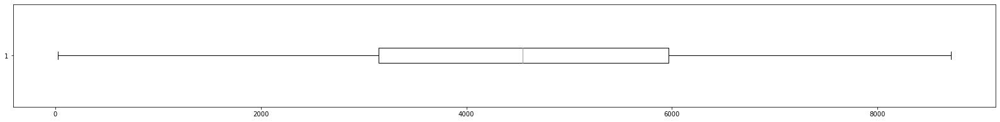

In [59]:
plt.figure(figsize = (28, 3))
plt.boxplot(reduceRentalBikeDF['cnt'], vert = False)
plt.show()

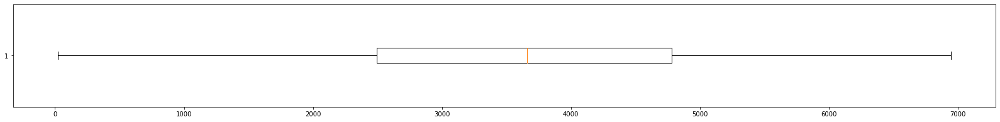

In [60]:
plt.figure(figsize = (28, 3))
plt.boxplot(reduceRentalBikeDF['Registered'], vert = False)
plt.show()

In [61]:
# Podemos ver que el comportamiento entre cnt y register es el mismo. Esto refuerza nuestra teoria de explorar que infuye en el
# uso de los usuarios registrados de las bicicletas.

<AxesSubplot:xlabel='Weather'>

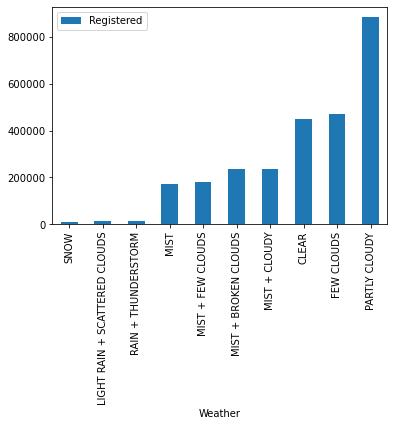

In [62]:
# Cantidad de usuarios por clima

df_cntByWeather= RentalBikesDF[['Registered','Weather']].groupby(['Weather']).sum('Registered')
df_cntByWeather=df_cntByWeather.sort_values('Registered', ascending=True).reset_index()
df_cntByWeather.plot('Weather','Registered', kind = 'bar')

In [63]:
# Con la gráfica nos permite intuir que los usuarios registrados salen no salen cuando nieba o niebla. 
# Salen poco cuando hay niebla y de resto salen. El hecho de que salgan mas cuando puede esta parcialmente nublado puede deberse
# a que la mayor parte del año esta nublado. 

<AxesSubplot:xlabel='Season'>

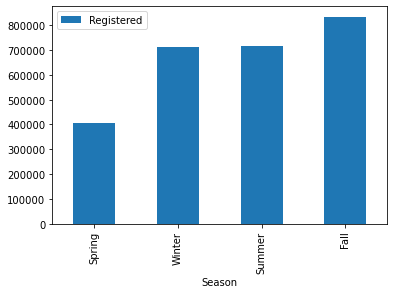

In [64]:
# Cantidad de usuarios por Temporada

df_cntBySeason= RentalBikesDF[['Registered','Season']].groupby(['Season']).sum('Registered')
df_cntBySeason=df_cntBySeason.sort_values('Registered', ascending=True).reset_index()
df_cntBySeason.plot('Season','Registered', kind = 'bar')

In [65]:
# Lo primero que podemos observar, visualmente, es que la cantidad de usuarios registrados en otoño es casi el doble que en primavera. Y
# mas curioso, es que el invierno y verano tienen una cantidad de usuarios registrados muy similar: Esto no deja de ser 
# curioso debido a que el indice de correlación entre el total de usuarios registrados vs la temperatura y sensación termica
# es del 0.54 aproximadanente, y las dos estaciones (Verano e Invierno) tienen climas radicalmente opuestos. 

# En este punto podemos empezar a concluir, a priori, que los usuarios no les importa la temporada del año para hacer uso de 
# la bicicleta sino las condiciones climaticas. Ahora revisemos los usuarios registrados vs Dia  

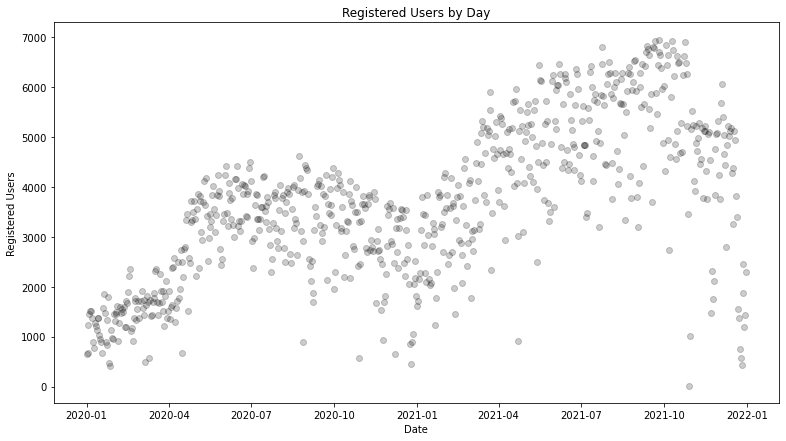

In [66]:
# Dia contra el total de usuarios

plt.figure(figsize = (13, 7))
plt.scatter(reduceRentalBikeDF['Date'], reduceRentalBikeDF['Registered'], alpha = 0.2, color = 'black')
plt.title('Registered Users by Day')
plt.xlabel('Date')
plt.ylabel('Registered Users')
plt.show()

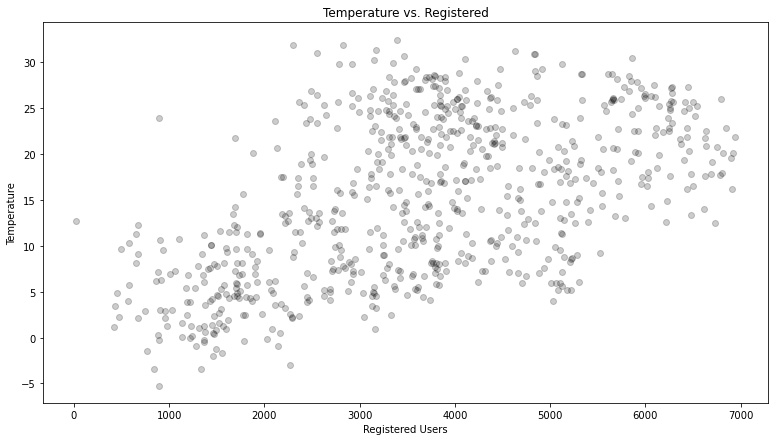

In [67]:
# Temperatura comparado contra el total de usuarios
plt.figure(figsize = (13, 7))
plt.scatter(reduceRentalBikeDF['Registered'], reduceRentalBikeDF['Temp'], alpha = 0.2, color = 'black')
plt.title('Temperature vs. Registered')
plt.xlabel('Registered Users')
plt.ylabel('Temperature')
plt.show()

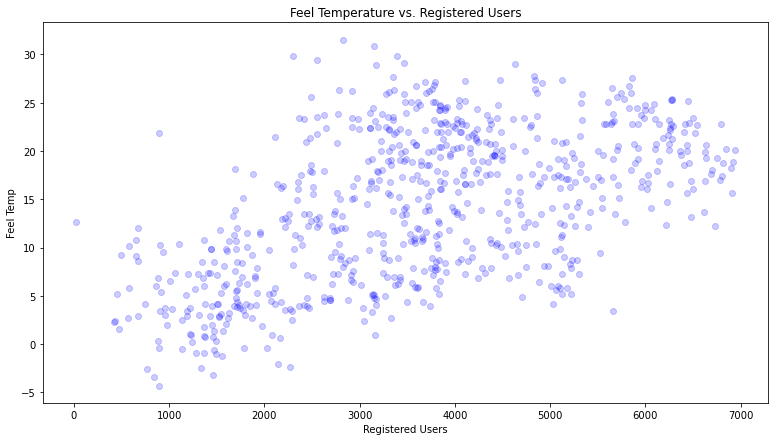

In [68]:
# Sensación Termica comparado contra el total de usuarios
plt.figure(figsize = (13, 7))
plt.scatter(reduceRentalBikeDF['Registered'],reduceRentalBikeDF['Feel_Temp'], alpha = 0.2, color = 'blue')
plt.title('Feel Temperature vs. Registered Users')
plt.xlabel('Registered Users')
plt.ylabel('Feel Temp')
plt.show()

<AxesSubplot:xlabel='Complex Weather'>

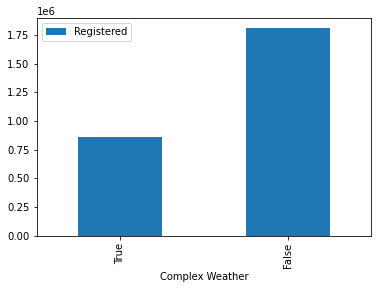

In [69]:
# Cantidad de usuarios teniendo en cuenta si hay clima complejo o no

df_cntByClxWeather= RentalBikesDF[['Complex Weather','Registered']].groupby(['Complex Weather']).sum('Registered')
df_cntByClxWeather=df_cntByClxWeather.sort_values('Registered', ascending=True).reset_index()
df_cntByClxWeather.plot('Complex Weather','Registered', kind = 'bar')

<AxesSubplot:xlabel='Day'>

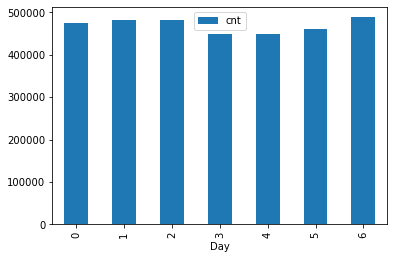

In [70]:
# Por ultimo, respondiendo la inquietud sobre el comportamiento de los usuarios durante la semana.

df_cntByDay= RentalBikesDF[['Day','cnt']].groupby(['Day']).sum('cnt')
df_cntByDay=df_cntByDay.sort_values('Day', ascending=True).reset_index()
df_cntByDay.plot('Day','cnt', kind = 'bar')

In [71]:
# Evidenciamos un comportamiento homogeneo en el uso de la bicicleta los 7 días de la semana.

<AxesSubplot:xlabel='Day'>

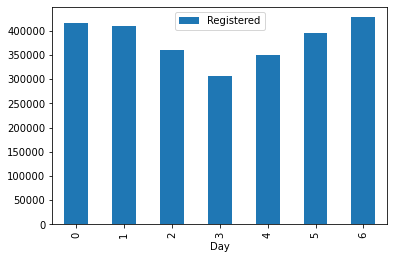

In [72]:
df_cntByDay= RentalBikesDF[['Day','Registered']].groupby(['Day']).sum('Registered')
df_cntByDay=df_cntByDay.sort_values('Day', ascending=True).reset_index()
df_cntByDay.plot('Day','Registered', kind = 'bar')

In [73]:
# Sucede algo similar con los usuarios registrados, aunque con una leve disminución los días miercoles

In [74]:
profile = ProfileReport(reduceRentalBikeDF)
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [75]:
# DESARROLLO DE MODELOS DE REGRESION (30 pts)
# Implemente al menos 3 modelos basados en el algoritmo de regresión lineal: uno simple,
# uno polinomial y uno con algún tipo de regularización.

In [76]:
# REGRESION LINEAL. Si bien es cierto, la variable objetivo es cnt, la voy a cambiar por Registered dado su alta correlación
# entre una y otra. Casual y cnt las voy a quitar.

lin_reg = LinearRegression()
x = reduceRentalBikeDF=RentalBikesDF[['Day','Season encoded','Holiday encoded','Weather encoded','Temp','Feel_Temp','Hum','Wind','Complex Weather']]
y = reduceRentalBikeDF=RentalBikesDF[['Registered']]

# Creando el set d epruebas y el set de entrenamiento
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size = 0.1, random_state = 1)

In [77]:
# Escalando caracteristicas
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
regr = LinearRegression()
regr.fit(X_train_scaled, Y_train)

LinearRegression()

In [78]:
regr.coef_

array([[   9.62451442,  412.70208952, -147.7406142 , -106.53276404,
        1078.09233346, -138.4472879 ,  -37.32072523, -145.76660883,
        -221.16056103]])

In [79]:
regr.intercept_

array([3665.60730594])

In [80]:
preds_train = regr.predict(X_train_scaled)
preds_test = regr.predict(X_test_scaled)

In [81]:
MAE_LinealRegretion=mean_absolute_error(Y_train, preds_train), mean_absolute_error(Y_test, preds_test)
MAE_LinealRegretion

(1027.2189842592843, 936.009932189698)

In [82]:
RMSE_LinealRegretion=np.sqrt(mean_squared_error(Y_train, preds_train)), np.sqrt(mean_squared_error(Y_test, preds_test))
RMSE_LinealRegretion

(1216.9322318690988, 1142.1169879336437)

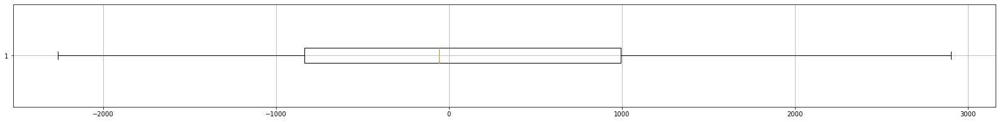

In [83]:
plt.figure(figsize = (28, 3))
plt.boxplot((Y_test - preds_test), vert = False)
plt.grid()
plt.show()

In [84]:
# REGRESION POLINOMIAL RIDGE. 

# Definiendo un nuevo el set de pruebas y el set de entrenamiento. Solo para poder "jugar" con el grado, alpha y tamaño del 
# set de forma independiente a los demás modelos.

x = reduceRentalBikeDF=RentalBikesDF[['Day','Season encoded','Holiday encoded','Weather encoded','Temp','Feel_Temp','Hum','Wind','Complex Weather']]
y = reduceRentalBikeDF=RentalBikesDF[['Registered']]

X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size = 0.40, random_state = 1)

poly_features = PolynomialFeatures(degree=3,include_bias=False)
x_poly = poly_features.fit_transform(X_train)
ridge_df = Ridge(alpha=1)
ridge_df.fit(x_poly,Y_train)
df_poly_training=ridge_df.predict(x_poly)
x_poly_test = poly_features.fit_transform(X_test)
ridge_df_test = Ridge(alpha=60)
ridge_df_test.fit(x_poly_test,Y_test)
df_poly_test=ridge_df_test.predict(x_poly_test)

In [85]:
MAE_RidgeRegretion=mean_absolute_error(Y_train, df_poly_training), mean_absolute_error(Y_test, df_poly_test)
MAE_RidgeRegretion

(693.5300766119352, 678.1109221226349)

In [86]:
RMSE_RidgeRegretion=np.sqrt(mean_squared_error(Y_train, df_poly_training)), np.sqrt(mean_squared_error(Y_test, df_poly_test))
RMSE_RidgeRegretion

(858.5475611776061, 847.8555504017984)

In [87]:
# REGRESION POLINOMIAL LASSO. 

In [88]:
#Para lasso, debemos reducir el tamaño de las variables, por lo que incluiremos solamente las que consideramos primordiales

x = reduceRentalBikeDF=RentalBikesDF[['Weather encoded','Temp','Feel_Temp','Complex Weather']]
y = reduceRentalBikeDF=RentalBikesDF[['Registered']]

# Definiendo un nuevo el set de pruebas y el set de entrenamiento. Solo para poder "jugar" con el grado, alpha y tamaño del 
# set de forma independiente a los demás modelos.

X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size = 0.25, random_state = 1)

lasso_features = PolynomialFeatures(degree=20,include_bias=False)
x_lasso = lasso_features.fit_transform(X_train)

lasso_df = Lasso(alpha=3)
lasso_df.fit(x_lasso,Y_train)
df_lasso_training=lasso_df.predict(x_lasso)
x_lasso_test = lasso_features.fit_transform(X_test)
lasso_df_test = Lasso(alpha=3)
lasso_df_test.fit(x_lasso_test,Y_test)

Lasso(alpha=3)

In [89]:
df_lasso_test=lasso_df_test.predict(x_lasso_test)
MAE_Laso=mean_absolute_error(Y_train, df_lasso_training), mean_absolute_error(Y_test, df_lasso_test)
MAE_Laso

(902.951383186066, 849.2454434237974)

In [90]:
RMSE_Lasso=np.sqrt(mean_squared_error(Y_train, df_lasso_training)), np.sqrt(mean_squared_error(Y_test, df_lasso_test))
RMSE_Lasso

(1108.728861880623, 1064.1205770467388)

In [91]:
# EVALUACION DE MODELOS (20 pts)
# Con base en el desempeño de cada uno de los modelos, concluya cuál es el modelo que se
# le debe presentar a la alcaldía. Justifique su respuesta.

In [92]:
MAE_LinealRegretion, MAE_RidgeRegretion, MAE_Laso

((1027.2189842592843, 936.009932189698),
 (693.5300766119352, 678.1109221226349),
 (902.951383186066, 849.2454434237974))

In [93]:
RMSE_LinealRegretion, RMSE_RidgeRegretion, RMSE_Lasso

((1216.9322318690988, 1142.1169879336437),
 (858.5475611776061, 847.8555504017984),
 (1108.728861880623, 1064.1205770467388))

In [94]:
# Al comparar la error medio absoluto entre los tres modelos, tengo un valor menos alto al utilizar la regresión polinomial ridge 
# y una diferecia no tan alta entre el MEAN de entrenamiento y el MEAN de pruebas, lo que me permite evidenciar que no tiene problemas
# de sobreentrenamiento y/o subentrenamiento. 
# En el caso del modelo LASSO, me estoy enfocando en unas pocas variables y para que la media del valor absoluto baje debo 
# aumentar bastante el nivel del grad y a pesar que lo lleve a grado 20 no baja el MEAN a niveles razonables
# Dado lo anterior, considero que se le debe presentar a la alcaldía el modelo de regresión Ridge.

In [95]:
# INTERPRETACION (10 pts)
# El día de la presentación de resultados, una persona de la alcaldía le hace las siguientes preguntas:
# - ¿Cuáles son las 3 variables más importantes para la predicción de la cantidad de usuarios?


In [96]:
RentalBikesDF[['Weather encoded','Temp','Feel_Temp','Casual','Registered','cnt','Complex Weather']].corr()

,Weather encoded,Temp,Feel_Temp,Casual,Registered,cnt,Complex Weather
Weather encoded,1.000000,-0.041807,-0.051932,-0.081051,-0.110812,-0.117945,0.145497
Temp,-0.041807,1.000000,0.991637,0.543933,0.540502,0.627944,-0.115573
Feel_Temp,-0.051932,0.991637,1.000000,0.544087,0.544342,0.631091,-0.114990
Casual,-0.081051,0.543933,0.544087,1.000000,0.396230,0.673364,-0.222900
Registered,-0.110812,0.540502,0.544342,0.396230,1.000000,0.945606,-0.215771
cnt,-0.117945,0.627944,0.631091,0.673364,0.945606,1.000000,-0.252719
Complex Weather,0.145497,-0.115573,-0.114990,-0.222900,-0.215771,-0.252719,1.000000


In [97]:
# RTA: La primera, es la cantidad de usuarios registrados-casuales (Es una variable con altacorrelación). La segunda es
# la sensación termica (FeelTemp) y la temperatura (temp), por ultimo tenemos el estado del clima. (Si llueve, Nieva o hace 
# neblina la gente no sale.

In [98]:
# - Describa cual es el escenario ideal para el incremento de usuarios.
# RTA: En los primero analisis des este informe se puede evidenciar que hay dos variables que inciden fuertemente: Temperatura que esta
# relacionada con la sensación termica y que no haga mal clima (puede estar nublado desde que no llueva, nieve o haga neblina).
# Es decir, Día sin mal clima y entre mayor temperatura mejor.

In [99]:
# - ¿Qué pasos adicionales deberían tener en cuenta para una próxima iteración/mejora del modelo?

In [ ]:
# RTA: Agregar mayor cantidad de variables (no solo clima y temperatura). Por ejemplo, estrato, si la persona tiene vehiculo,
# distancia que se desplaza, zona donde vive, razón por la que se desplaza, entre otros. Enriquecer el modelo 